In [76]:
import contextily as ctx
import geopandas as gpd
import pandas as pd
import libpysal as lps
import pysal as ps
import palettable as pltt

import datashader as ds
import datashader.transfer_functions as tf
from datashader.bundling import connect_edges, hammer_bundle
from datashader.colors import inferno, viridis
from datashader.utils import export_image

from colorcet import palette
from matplotlib import cm

In [64]:
edges = pd.read_csv("gg_edges.csv")
edges = edges[edges['month']==1].drop('month', axis=1)

edges.head()

,focal,target,weight
17,10150014004,421010002001,4
22,10199560003,421010134023,4
31,10310112013,421019800001,4
42,10499604002,421010010021,4
47,10539701003,421019809001,4


In [65]:
nodes = pd.read_csv("gg_nodes.csv")
nodes = nodes.set_index('cbg')

nodes.head()

,X,Y
cbg,,
421010274025,2.703558e+06,269917.929361
421010279021,2.695731e+06,268673.608611
421010315022,2.723628e+06,269489.602884
421010029001,2.692812e+06,227288.850551
421010330007,2.728623e+06,267193.128419


In [66]:
%%time
g1 = connect_edges(nodes, edges,
                   source='focal', target='target',
                   x='X', y='Y')

CPU times: user 330 ms, sys: 47.5 ms, total: 377 ms
Wall time: 406 ms


In [67]:
palette["viridis"]=viridis
palette["inferno"]=inferno

In [73]:
%%time
g2 = hammer_bundle(nodes, edges,
                   source='focal', target='target',
                   decay=0.25,
                   initial_bandwidth=0.1,
                   x='X', y='Y')

CPU times: user 52.6 s, sys: 48.2 s, total: 1min 40s
Wall time: 1min 1s


Unbundled,Bundled

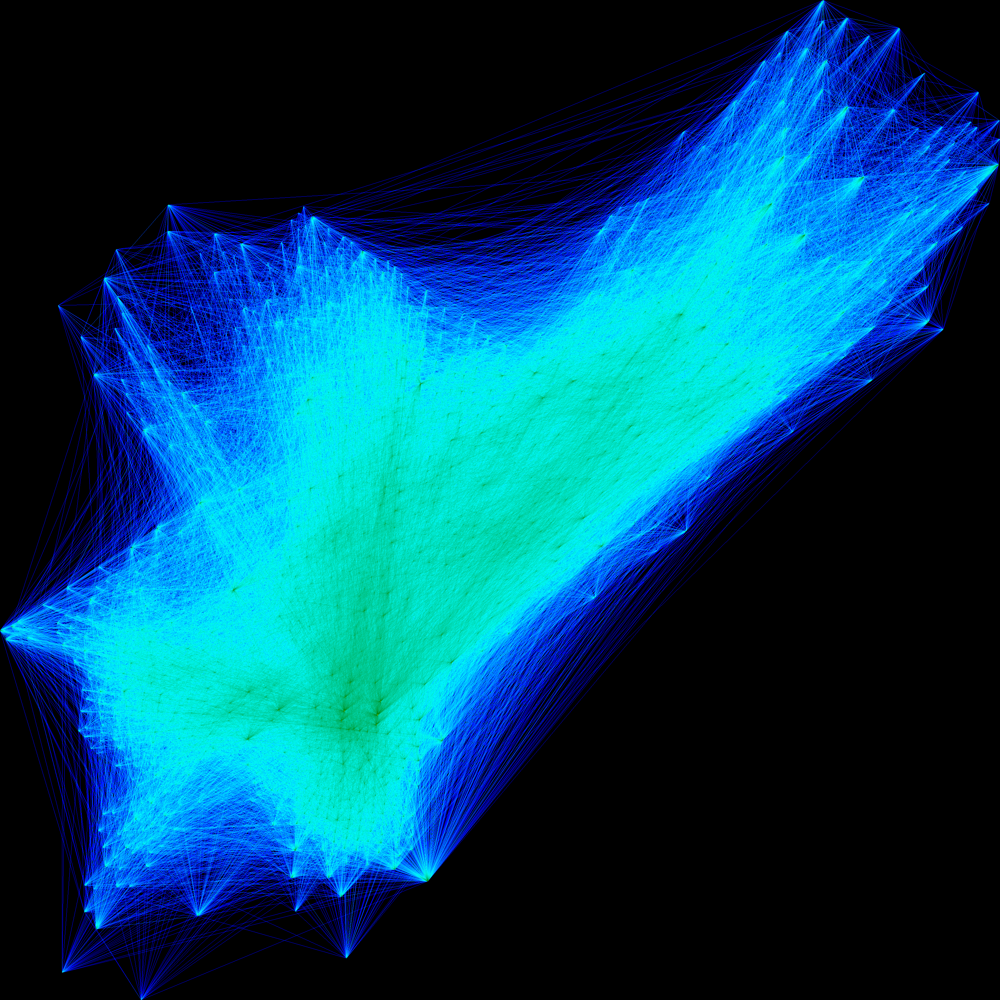
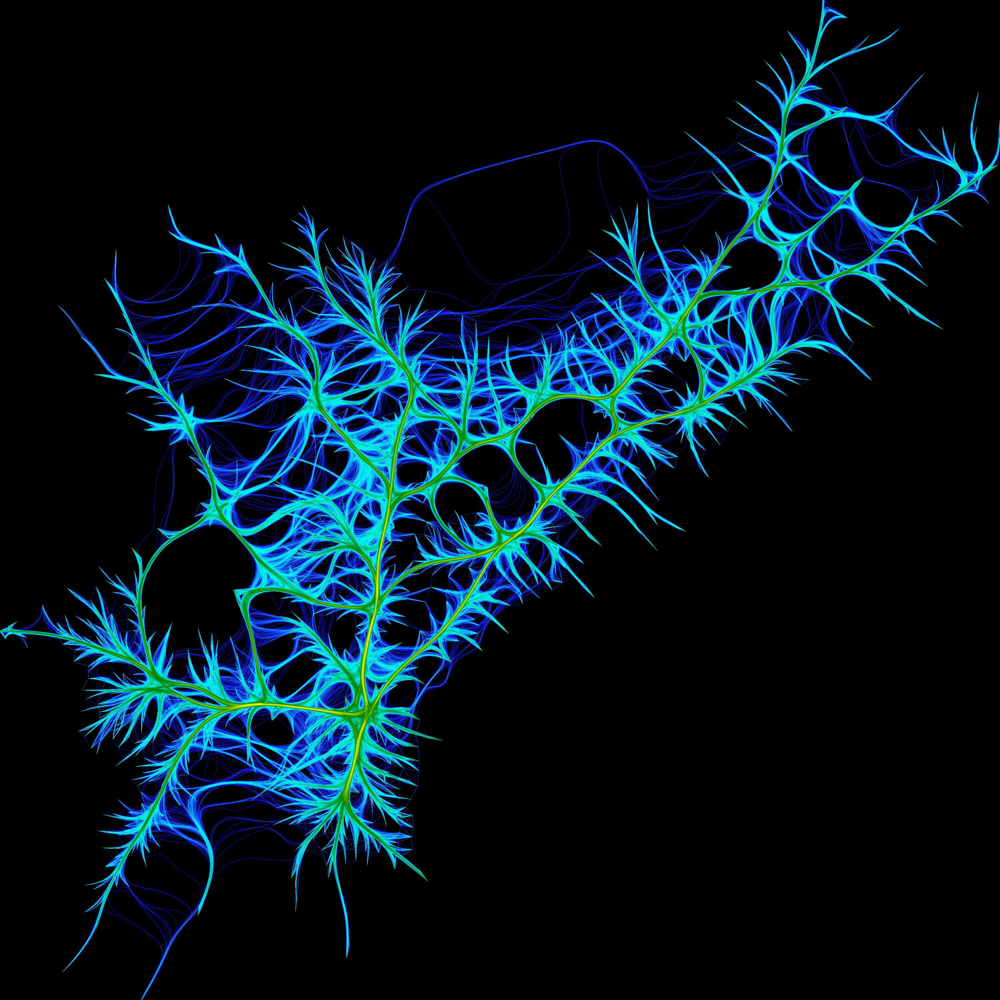

In [74]:
canvas = ds.Canvas(x_range=(nodes['X'].min(), nodes['X'].max()),
                   y_range=(nodes['Y'].min(), nodes['Y'].max()),
                   plot_height=3000, plot_width=3000)


p1 = tf.shade(canvas.line(g1, 'X', 'Y', agg=ds.count()),  cmap=['blue', 'cyan', 'green', 'yellow'], how='log', name="Unbundled")

canvas = ds.Canvas(x_range=(nodes['X'].min(), nodes['X'].max()),
                   y_range=(nodes['Y'].min(), nodes['Y'].max()),
                   plot_height=3000, plot_width=3000)

p2 = tf.shade(canvas.line(g2, 'X','Y', agg=ds.count()), cmap=['blue', 'cyan', 'green', 'yellow'], how='log', name="Bundled")

tf.Images(tf.set_background(p1, "#000000"), tf.set_background(p2, "#000000")).cols(2)

In [109]:
pal = pd.read_csv("https://raw.githubusercontent.com/asrenninger/philamonitor/master/miscellany/pal.txt", 
                  header=None, squeeze=True).tolist()

In [78]:
edges = pd.read_csv("gg_edges.csv")

In [112]:
graph_list = list()

for mon in np.sort(edges.month.unique()):
    print(mon)
    
    temp = edges[edges['month']==mon].drop('month', axis=1)
    
    g = hammer_bundle(nodes, temp,
                      source='focal', target='target',
                      decay=0.25,
                      x='X', y='Y', weight='weight')
    
    graph_list.append(g)

1
2
3
4
5
6
7
8


In [113]:
for i in np.arange(0, 8):
    
    temp = tf.shade(canvas.line(graph_list[i], 'X','Y', agg=ds.count()), cmap=pal[1:11], how='log')
    export_image(tf.set_background(temp, "#000000"), f"{i+1}")

In [99]:
graph_list = list()

for mon in np.sort(edges.month.unique()):
    print(mon)
    
    temp = edges[edges['month']==mon].drop('month', axis=1)
    
    g = connect_edges(nodes, temp,
                      source='focal', target='target',
                      x='X', y='Y')
    
    graph_list.append(g)

1
2
3
4
5
6
7
8


In [108]:
for i in np.arange(0, 8):
    
    temp = tf.shade(canvas.line(graph_list[i], 'X','Y', agg=ds.count()), cmap=pal[1:11], how='log')
    export_image(tf.set_background(temp, "#000000"), f"{i+1}")

In [182]:
def nodesplot(nodes):
    canvas = ds.Canvas(x_range=(nodes['X'].min(), nodes['X'].max()),
                       y_range=(nodes['Y'].min(), nodes['Y'].max()),
                       plot_height=3000, plot_width=3000)
    
    agg = canvas.points(nodes,'X','Y',agg=None)
    spr = tf.spread(tf.shade(agg, cmap=pal[1]), px=5)
    
    return spr

def edgesplot(edges):
    canvas = ds.Canvas(x_range=(nodes['X'].min(), nodes['X'].max()),
                       y_range=(nodes['Y'].min(), nodes['Y'].max()),
                       plot_height=3000, plot_width=3000)
    
    agg = canvas.line(edges, 'X','Y', agg=ds.count())
    spr = tf.shade(agg, cmap=pal[1:11], how='log')
    
    return spr

def combiplot(nodes, edges):
    
    verts = nodesplot(nodes)
    links = edgesplot(edges)
    
    stack = tf.stack(verts, links)
    
    return tf.set_background(stack, pal[0])

In [189]:
abridged = edges[edges['weight']>10]

In [194]:
graph_list = list()

for mon in np.sort(abridged.month.unique()):
    print(mon)
    
    temp = abridged[abridged['month']==mon].drop('month', axis=1)
    
    g = hammer_bundle(nodes, temp,
                      source='focal', target='target',
                      decay=0.25,
                      x='X', y='Y', weight='weight')
    
    graph_list.append(g)

1
2
3
4
5
6
7
8


In [195]:
for i in np.arange(0, 8):
    
    temp = combiplot(nodes, graph_list[i])
    
    export_image(temp, f"{i+1}")

In [192]:
graph_list = list()

for mon in np.sort(abridged.month.unique()):
    print(mon)
    
    temp = abridged[abridged['month']==mon].drop('month', axis=1)
    
    g = connect_edges(nodes, temp,
                      source='focal', target='target',
                      x='X', y='Y')
    
    graph_list.append(g)

1
2
3
4
5
6
7
8


In [193]:
for i in np.arange(0, 8):
    
    temp = combiplot(nodes, graph_list[i])
    
    export_image(temp, f"{i+1}")